# Hourly Time Series Forecasting

In this notebook we will use a package to forecast hourly energy use. 

In [2]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error
plt.style.use('fivethirtyeight') # For plots

# Data
The data we will be using is hourly power consumption data from PJM. Energy consumtion has some unique charachteristics. It will be interesting to see how prophet picks them up.

Pulling the `PJM East` which has data from 2002-2018 for the entire east region.

In [9]:
pjme = pd.read_csv("C:/Users/USER/Desktop/Forecasting/PJME_hourly.csv/PJME_hourly.csv",
                   index_col=[0], parse_dates=[0]) # We set the index column and know it has dates

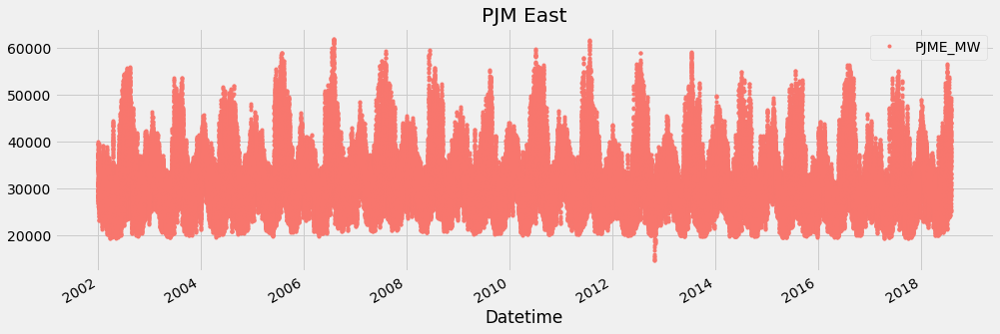

In [10]:
# Color pallete for plotting
color_pal = ["#F8766D", "#D39200", "#93AA00",
             "#00BA38", "#00C19F", "#00B9E3",
             "#619CFF", "#DB72FB"]
pjme.plot(style='.', figsize=(15,5), color=color_pal[0], title='PJM East')
plt.show()

# EDA

We will creat some time series features to see how the trends are impacted by day of week, hour, time of year, etc.

In [12]:
def create_features(df, label=None):
    """
    Creates time series features from datetime index.
    """
    df = df.copy()
    df['date'] = df.index
    df['hour'] = df['date'].dt.hour
    df['dayofweek'] = df['date'].dt.dayofweek
    df['quarter'] = df['date'].dt.quarter
    df['month'] = df['date'].dt.month
    df['year'] = df['date'].dt.year
    df['dayofyear'] = df['date'].dt.dayofyear
    df['dayofmonth'] = df['date'].dt.day
    
    X = df[['hour','dayofweek','quarter','month','year',
           'dayofyear','dayofmonth']]
    if label:
        y = df[label]
        return X, y
    return X

X, y = create_features(pjme, label='PJME_MW')

features_and_target = pd.concat([X, y], axis=1)

In [13]:
# See our features and target
features_and_target.head()

,hour,dayofweek,quarter,month,year,dayofyear,dayofmonth,PJME_MW
Datetime,,,,,,,,
2002-12-31 01:00:00,1,1,4,12,2002,365,31,26498.0
2002-12-31 02:00:00,2,1,4,12,2002,365,31,25147.0
2002-12-31 03:00:00,3,1,4,12,2002,365,31,24574.0
2002-12-31 04:00:00,4,1,4,12,2002,365,31,24393.0
2002-12-31 05:00:00,5,1,4,12,2002,365,31,24860.0


## Plotting the Features to see trends
- Power demand has strong daily and seasonal properties.
- Day of week also seems to show differences in peaks

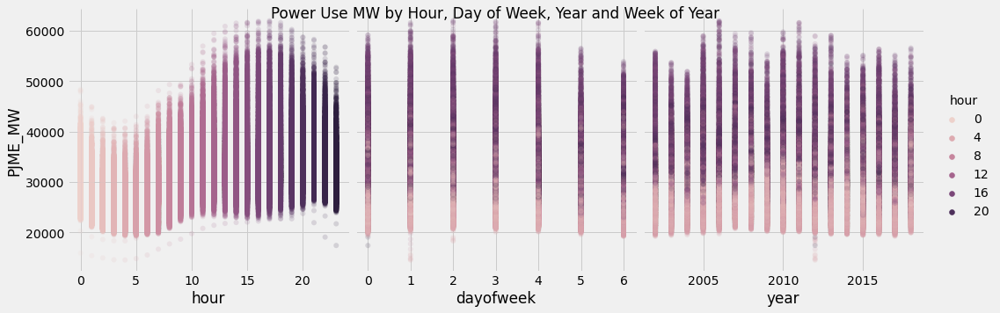

In [19]:
sns.pairplot(features_and_target.dropna(),
             hue='hour',
             x_vars=['hour','dayofweek',
                     'year'],
             y_vars='PJME_MW',
             height=5,
             plot_kws={'alpha':0.15, 'linewidth':0}
            )
plt.suptitle('Power Use MW by Hour, Day of Week, Year and Week of Year')
plt.show()

# Train/Test Split
Cut off the data after 2015 to use as our validation set. We will train on earlier data.

In [20]:
split_date = '01-Jan-2015'
pjme_train = pjme.loc[pjme.index <= split_date].copy()
pjme_test = pjme.loc[pjme.index > split_date].copy()

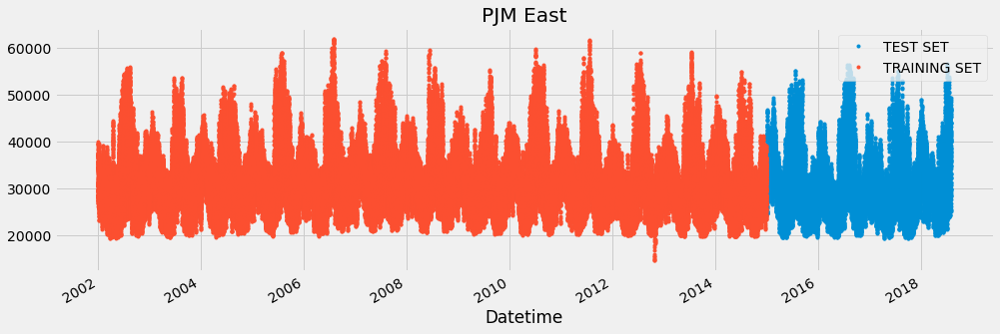

In [21]:
# Plot train and test so you can see where we have split
pjme_test \
    .rename(columns={'PJME_MW': 'TEST SET'}) \
    .join(pjme_train.rename(columns={'PJME_MW': 'TRAINING SET'}),
          how='outer') \
    .plot(figsize=(15,5), title='PJM East', style='.')
plt.show()

# Simple Model
- The model expects the dataset to be named a specific way. We will rename our dataframe columns before feeding it into the model.

In [22]:
# Format data for prophet model using ds and y
pjme_train.reset_index() \
    .rename(columns={'Datetime':'ds',
                     'PJME_MW':'y'}).head()

,ds,y
0,2002-12-31 01:00:00,26498.0
1,2002-12-31 02:00:00,25147.0
2,2002-12-31 03:00:00,24574.0
3,2002-12-31 04:00:00,24393.0
4,2002-12-31 05:00:00,24860.0


In [30]:
pip install pystan

  ERROR: Command errored out with exit status 1:
   command: 'C:\Users\USER\anaconda3\python.exe' -u -c 'import io, os, sys, setuptools, tokenize; sys.argv[0] = '"'"'C:\\Users\\USER\\AppData\\Local\\Temp\\pip-install-_hciiujl\\pystan_a253115f848a4aa4913fb154e91339ff\\setup.py'"'"'; __file__='"'"'C:\\Users\\USER\\AppData\\Local\\Temp\\pip-install-_hciiujl\\pystan_a253115f848a4aa4913fb154e91339ff\\setup.py'"'"';f = getattr(tokenize, '"'"'open'"'"', open)(__file__) if os.path.exists(__file__) else io.StringIO('"'"'from setuptools import setup; setup()'"'"');code = f.read().replace('"'"'\r\n'"'"', '"'"'\n'"'"');f.close();exec(compile(code, __file__, '"'"'exec'"'"'))' bdist_wheel -d 'C:\Users\USER\AppData\Local\Temp\pip-wheel-y7sxc_qy'
       cwd: C:\Users\USER\AppData\Local\Temp\pip-install-_hciiujl\pystan_a253115f848a4aa4913fb154e91339ff\
  Complete output (17845 lines):
  Compiling pystan/_api.pyx because it depends on C:\Users\USER\anaconda3\lib\site-packages\Cython\Includes\libcpp\vect


  Using cached pystan-3.6.0-py3-none-any.whl (13 kB)
  Using cached pystan-3.5.0-py3-none-any.whl (13 kB)
  Using cached pystan-3.4.0-py3-none-any.whl (13 kB)
  Using cached pystan-3.3.0-py3-none-any.whl (13 kB)
  Using cached pystan-3.2.0-py3-none-any.whl (13 kB)
  Using cached pystan-3.1.1-py3-none-any.whl (13 kB)
  Using cached pystan-3.1.0-py3-none-any.whl (13 kB)
  Using cached pystan-3.0.2-py3-none-any.whl (13 kB)
  Using cached pystan-3.0.1-py3-none-any.whl (12 kB)
  Using cached pystan-3.0.0-py3-none-any.whl (12 kB)
  Using cached pystan-2.19.1.1.tar.gz (16.2 MB)
  Running setup.py clean for pystan
Failed to build pystan
    Running setup.py install for pystan: started
    Running setup.py install for pystan: finished with status 'error'



  copying pystan\api.py -> build\lib.win-amd64-3.9\pystan
  copying pystan\chains.py -> build\lib.win-amd64-3.9\pystan
  copying pystan\constants.py -> build\lib.win-amd64-3.9\pystan
  copying pystan\diagnostics.py -> build\lib.win-amd64-3.9\pystan
  copying pystan\lookup.py -> build\lib.win-amd64-3.9\pystan
  copying pystan\misc.py -> build\lib.win-amd64-3.9\pystan
  copying pystan\model.py -> build\lib.win-amd64-3.9\pystan
  copying pystan\plots.py -> build\lib.win-amd64-3.9\pystan
  copying pystan\_compat.py -> build\lib.win-amd64-3.9\pystan
  copying pystan\__init__.py -> build\lib.win-amd64-3.9\pystan
  creating build\lib.win-amd64-3.9\pystan\tests
  copying pystan\tests\helper.py -> build\lib.win-amd64-3.9\pystan\tests
  copying pystan\tests\test_basic.py -> build\lib.win-amd64-3.9\pystan\tests
  copying pystan\tests\test_basic_array.py -> build\lib.win-amd64-3.9\pystan\tests
  copying pystan\tests\test_basic_matrix.py -> build\lib.win-amd64-3.9\pystan\tests
  copying pystan\tes

In [31]:
pip install fbprophet


  copying pystan\stan\lib\stan_math\lib\boost_1.69.0\boost\concept_archetype.hpp -> build\lib.win-amd64-3.9\pystan\stan\lib\stan_math\lib\boost_1.69.0\boost
  copying pystan\stan\lib\stan_math\lib\boost_1.69.0\boost\concept_check.hpp -> build\lib.win-amd64-3.9\pystan\stan\lib\stan_math\lib\boost_1.69.0\boost
  copying pystan\stan\lib\stan_math\lib\boost_1.69.0\boost\config.hpp -> build\lib.win-amd64-3.9\pystan\stan\lib\stan_math\lib\boost_1.69.0\boost
  copying pystan\stan\lib\stan_math\lib\boost_1.69.0\boost\contract.hpp -> build\lib.win-amd64-3.9\pystan\stan\lib\stan_math\lib\boost_1.69.0\boost
  copying pystan\stan\lib\stan_math\lib\boost_1.69.0\boost\contract_macro.hpp -> build\lib.win-amd64-3.9\pystan\stan\lib\stan_math\lib\boost_1.69.0\boost
  copying pystan\stan\lib\stan_math\lib\boost_1.69.0\boost\convert.hpp -> build\lib.win-amd64-3.9\pystan\stan\lib\stan_math\lib\boost_1.69.0\boost
  copying pystan\stan\lib\stan_math\lib\boost_1.69.0\boost\crc.hpp -> build\lib.win-amd64-3.9\

  ERROR: Command errored out with exit status 1:
   command: 'C:\Users\USER\anaconda3\python.exe' -u -c 'import io, os, sys, setuptools, tokenize; sys.argv[0] = '"'"'C:\\Users\\USER\\AppData\\Local\\Temp\\pip-install-_jv46j10\\fbprophet_7b18fbb6f064443e80260e2d90fb7a52\\setup.py'"'"'; __file__='"'"'C:\\Users\\USER\\AppData\\Local\\Temp\\pip-install-_jv46j10\\fbprophet_7b18fbb6f064443e80260e2d90fb7a52\\setup.py'"'"';f = getattr(tokenize, '"'"'open'"'"', open)(__file__) if os.path.exists(__file__) else io.StringIO('"'"'from setuptools import setup; setup()'"'"');code = f.read().replace('"'"'\r\n'"'"', '"'"'\n'"'"');f.close();exec(compile(code, __file__, '"'"'exec'"'"'))' bdist_wheel -d 'C:\Users\USER\AppData\Local\Temp\pip-wheel-looxf8zm'
       cwd: C:\Users\USER\AppData\Local\Temp\pip-install-_jv46j10\fbprophet_7b18fbb6f064443e80260e2d90fb7a52\
  Complete output (194 lines):
  running bdist_wheel
  running build
  running build_py
  creating build
  creating build\lib
  creating build\


  Using cached fbprophet-0.7.1.tar.gz (64 kB)
  Using cached cmdstanpy-0.9.5-py3-none-any.whl (37 kB)
  Using cached pystan-3.6.0-py3-none-any.whl (13 kB)
  Using cached LunarCalendar-0.0.9-py2.py3-none-any.whl (18 kB)
  Using cached convertdate-2.4.0-py3-none-any.whl (47 kB)
  Using cached holidays-0.18-py3-none-any.whl (195 kB)
  Using cached setuptools_git-1.2-py2.py3-none-any.whl (10 kB)
  Using cached clikit-0.6.2-py2.py3-none-any.whl (91 kB)
  Using cached pystan-3.5.0-py3-none-any.whl (13 kB)
  Using cached pystan-3.4.0-py3-none-any.whl (13 kB)
  Using cached pystan-3.3.0-py3-none-any.whl (13 kB)
  Using cached pystan-3.2.0-py3-none-any.whl (13 kB)
  Using cached pystan-3.1.1-py3-none-any.whl (13 kB)
  Using cached pystan-3.1.0-py3-none-any.whl (13 kB)
  Using cached pystan-3.0.2-py3-none-any.whl (13 kB)
  Using cached pystan-3.0.1-py3-none-any.whl (12 kB)
  Using cached pystan-3.0.0-py3-none-any.whl (12 kB)
  Using cached pystan-2.19.1.1.tar.gz (16.2 MB)
  Running setup.py cle


    File "<string>", line 1, in <module>
    File "C:\Users\USER\AppData\Local\Temp\pip-install-_jv46j10\fbprophet_7b18fbb6f064443e80260e2d90fb7a52\setup.py", line 122, in <module>
      setup(
    File "C:\Users\USER\anaconda3\lib\site-packages\setuptools\__init__.py", line 87, in setup
      return distutils.core.setup(**attrs)
    File "C:\Users\USER\anaconda3\lib\site-packages\setuptools\_distutils\core.py", line 148, in setup
      return run_commands(dist)
    File "C:\Users\USER\anaconda3\lib\site-packages\setuptools\_distutils\core.py", line 163, in run_commands
      dist.run_commands()
    File "C:\Users\USER\anaconda3\lib\site-packages\setuptools\_distutils\dist.py", line 967, in run_commands
      self.run_command(cmd)
    File "C:\Users\USER\anaconda3\lib\site-packages\setuptools\dist.py", line 1214, in run_command
      super().run_command(command)
    File "C:\Users\USER\anaconda3\lib\site-packages\setuptools\_distutils\dist.py", line 986, in run_command
      cmd_obj.r

**Bitcoin Time Series Forecasting**

Bitcoin is the longest running and most well known cryptocurrency, first released as open source in 2009 by the anonymous Satoshi Nakamoto. Bitcoin serves as a decentralized medium of digital exchange, with transactions verified and recorded in a public distributed ledger (the blockchain) without the need for a trusted record keeping authority or central intermediary. Transaction blocks contain a SHA-256 cryptographic hash of previous transaction blocks, and are thus "chained" together, serving as an immutable record of all transactions that have ever occurred. As with any currency/commodity on the market, bitcoin trading and financial instruments soon followed public adoption of bitcoin and continue to grow.  If you don't know what Bitcoin is , then get some knowledge about Bitcoin [here](https://www.coindesk.com/information/what-is-bitcoin) .

This Kernel is divided into two parts:-

* Data Exploration
* Time Series Analysis

And further for the **Time Series Forecasting:**-

*  Time Series forecasting with **LSTM**
* Time Series forecasting with **XGBoost**
* Time Series forecasting with Facebook **Prophet**
* Time Series forecasting with **ARIMA**

This kernel takes inspiration from the following kernels,
* [Time Series forecasting with Prophet by Rob Mulla](https://www.kaggle.com/robikscube/tutorial-time-series-forecasting-with-prophet)
* [Time Series forecasting with XGBoost by Rob Mulla ](https://www.kaggle.com/robikscube/tutorial-time-series-forecasting-with-xgboost)
* [Bitcoin Price. Prediction by ARIMA by Артём](https://www.kaggle.com/myonin/bitcoin-price-prediction-by-arima)

**Data Exploration**

In this section we just explore the Data i.e the Historic Bitcoin Prices and try to find some insights. We will be using the Coinbase dataset as it is one of the mostly used Bitcoin Exchange/Wallet in the world.

In [3]:
import datetime, pytz
#define a conversion function for the native timestamps in the csv file
def dateparse (time_in_secs):    
    return pytz.utc.localize(datetime.datetime.fromtimestamp(float(time_in_secs)))


data = pd.read_csv("C:/Users/USER/Desktop/Forecasting/coinbaseUSD_1-min_data_2014-12-01_to_2018-11-11.csv/coinbaseUSD_1-min_data_2014-12-01_to_2018-11-11.csv", parse_dates=[0], date_parser=dateparse)

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2016354 entries, 0 to 2016353
Data columns (total 8 columns):
 #   Column             Dtype              
---  ------             -----              
 0   Timestamp          datetime64[ns, UTC]
 1   Open               float64            
 2   High               float64            
 3   Low                float64            
 4   Close              float64            
 5   Volume_(BTC)       float64            
 6   Volume_(Currency)  float64            
 7   Weighted_Price     float64            
dtypes: datetime64[ns, UTC](1), float64(7)
memory usage: 123.1 MB


In [5]:
data.head()

,Timestamp,Open,High,Low,Close,Volume_(BTC),Volume_(Currency),Weighted_Price
0,2014-12-01 06:33:00+00:00,300.0,300.0,300.0,300.0,0.01,3.0,300.0
1,2014-12-01 06:34:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2014-12-01 06:35:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2014-12-01 06:36:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2014-12-01 06:37:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Little preprocessing required, replacing the NaN values with zeroes and previous data.

In [6]:
# First thing is to fix the data for bars/candles where there are no trades. 
# Volume/trades are a single event so fill na's with zeroes for relevant fields...
data['Volume_(BTC)'].fillna(value=0, inplace=True)
data['Volume_(Currency)'].fillna(value=0, inplace=True)
data['Weighted_Price'].fillna(value=0, inplace=True)

# next we need to fix the OHLC (open high low close) data which is a continuous timeseries so
# lets fill forwards those values...
data['Open'].fillna(method='ffill', inplace=True)
data['High'].fillna(method='ffill', inplace=True)
data['Low'].fillna(method='ffill', inplace=True)
data['Close'].fillna(method='ffill', inplace=True)

data.head()

,Timestamp,Open,High,Low,Close,Volume_(BTC),Volume_(Currency),Weighted_Price
0,2014-12-01 06:33:00+00:00,300.0,300.0,300.0,300.0,0.01,3.0,300.0
1,2014-12-01 06:34:00+00:00,300.0,300.0,300.0,300.0,0.00,0.0,0.0
2,2014-12-01 06:35:00+00:00,300.0,300.0,300.0,300.0,0.00,0.0,0.0
3,2014-12-01 06:36:00+00:00,300.0,300.0,300.0,300.0,0.00,0.0,0.0
4,2014-12-01 06:37:00+00:00,300.0,300.0,300.0,300.0,0.00,0.0,0.0


Creating Weekly Rows for the Data Visualization

In [7]:
# create valid date range
start = datetime.datetime(2015, 1, 1, 0, 0, 0, 0, pytz.UTC)
end = datetime.datetime(2018, 11, 11, 0, 0, 0, 0, pytz.UTC)

# find rows between start and end time and find the first row (00:00 monday morning)
weekly_rows = data[(data['Timestamp'] >= start) & (data['Timestamp'] <= end)].groupby([pd.Grouper(key='Timestamp', freq='W-MON')]).first().reset_index()
weekly_rows.head()

,Timestamp,Open,High,Low,Close,Volume_(BTC),Volume_(Currency),Weighted_Price
0,2015-01-12 00:00:00+00:00,360.00,360.00,360.00,360.00,0.010000,3.600000,360.000000
1,2015-01-19 00:00:00+00:00,260.00,260.00,260.00,260.00,1.000000,260.000000,260.000000
2,2015-01-26 00:00:00+00:00,225.51,225.51,225.51,225.51,0.000000,0.000000,0.000000
3,2015-02-02 00:00:00+00:00,270.00,270.00,269.61,270.00,13.261140,3580.492905,269.998871
4,2015-02-09 00:00:00+00:00,232.02,233.00,231.99,233.00,45.843546,10655.625774,232.434590
